<a href="https://colab.research.google.com/github/thalisrocha/Math-morphology-hist-manipulation/blob/main/TP_28_10_THALIS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Practical Session 2 : Mathematical Morphology and Histogram manipulations

The aim of this practical work is to get acquainted with mathematical morphology
transformations. Applying different operations with several structuring elements on
simple images will allow you understanding the actions, effects and properties of the
operations, the role of the structuring element, as well as the need for appropriate
pre-processing depending on the application at hand.

In this session, we will mainly focus on functions from the skimage.morphology package.

In [ ]:
#Dowmloading images
!wget https://perso.telecom-paristech.fr/rachddou/teaching_material/images.zip
!unzip -qq images.zip
!rm images.zip
!rm -rf __MACOSX

--2022-11-12 17:09:29--  https://perso.telecom-paristech.fr/rachddou/teaching_material/images.zip
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 137.194.22.227, 2a04:8ec0:0:a::89c2:16e3
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|137.194.22.227|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 22981078 (22M) [application/zip]
Saving to: ‘images.zip’

images.zip          100%[===================>]  21.92M  14.1MB/s    in 1.6s    

2022-11-12 17:09:31 (14.1 MB/s) - ‘images.zip’ saved [22981078/22981078]



In [ ]:
## imports
import matplotlib.pyplot as plt
import skimage.io as skio
import skimage
import numpy as np
import skimage.morphology as morpho
student = True

## Mathematical morphology

### The structuring element
The basic idea in mathematical orphology is to probe an image with a simple, pre-defined shape, drawing conclusions on how this shape fits or misses the shapes in the image. This simple "probe" is called the structuring element. For example, it can take the shape of a square, a disk or a diamond, with a predefined radius.

Use the functions of the morpho library to visualize a disk structuring element of radius 3.

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


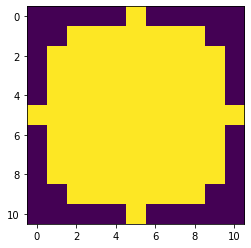

In [ ]:
if student :
  strell = morpho.disk(5)

print(strell)
plt.imshow(strell)
plt.show()

Find a way to create a vertical line as a structuring element with parameter length l :

In [ ]:
def line_strell(l):
  if student :
    strell = np.ones((l,1)).astype("uint8")
  return strell

if student :
  l = 6
  strell_line = line_strell(l)



### Binary Morphology
In this section, we will work on a cyto-image. Make sure to properly load the "cell.tif" image. Apply a thresholding of level t = 150 to that image to turn it into a binary image. Visualize the result in greyscale, by using the imshow function.

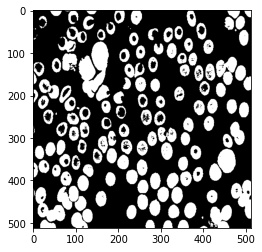

In [ ]:
#load the cell image in grayscale and display it
if student:
  seuil = 150
  img = skio.imread("images/cell.tif")
  img = (img<seuil) # Theresholding and display

  plt.imshow(img, cmap='gray')

We will first start by applying simple binary morphological operations on those images. You will try the following operations:
- erosion
- dilation
- opening
- closing

You will try to visualize the results by varying the structuring element and its size.  

In [ ]:

def apply_dilation(img, strell):
  strell2 = strell(2*2+1)
  strell3 = strell(2*3+1)
  strell5 = strell(2*5+1)

  img1 = morpho.binary_dilation(img, strell2)
  img2 = morpho.binary_dilation(img1,strell3)
  img3 = morpho.binary_dilation(img, strell5)

  comparison = abs((img3*255-img2*255))

  fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
  axs[0].imshow(img2.astype("uint8"), cmap="gray")
  axs[1].imshow(img3.astype("uint8"), cmap="gray")
  axs[2].imshow(comparison, cmap="gray")
  axs[0].set_title('Img 1 - Taille 2+3')
  axs[1].set_title('Img2 - Taille 5')
  axs[2].set_title('abs(Img1 - Img2)')



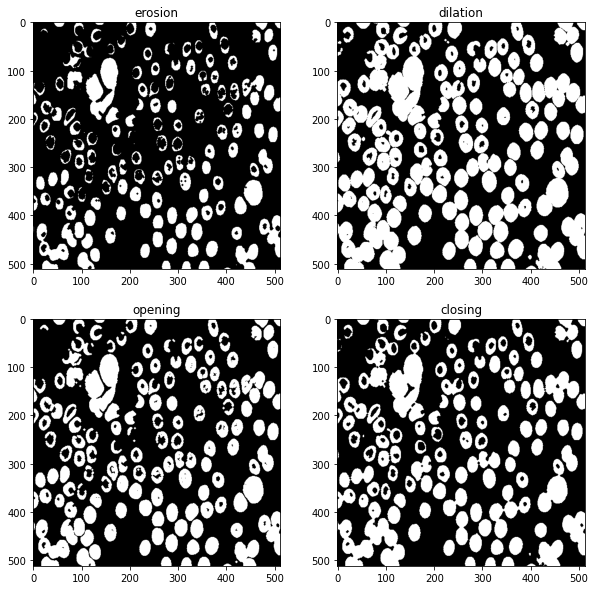

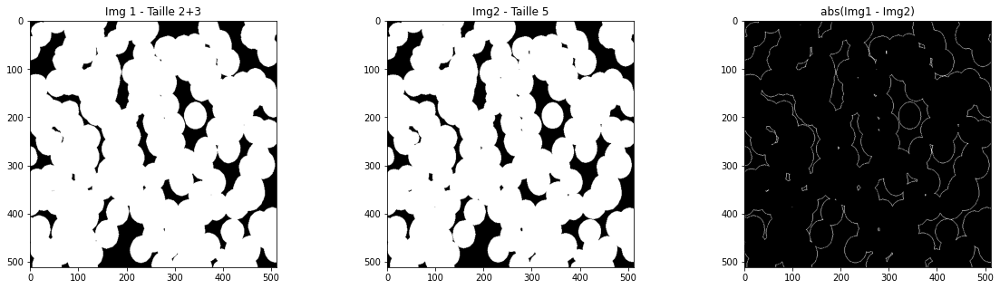

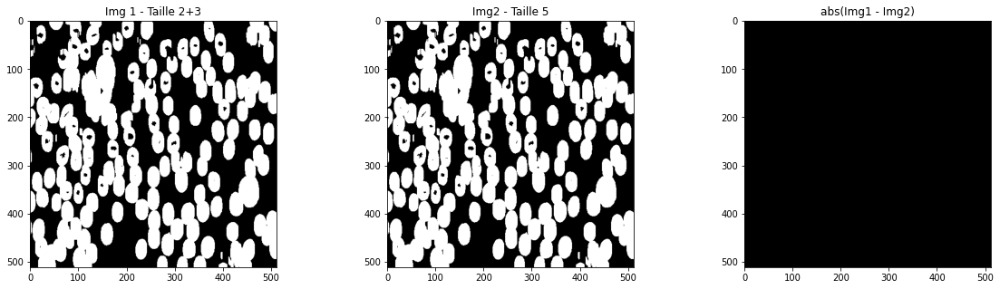

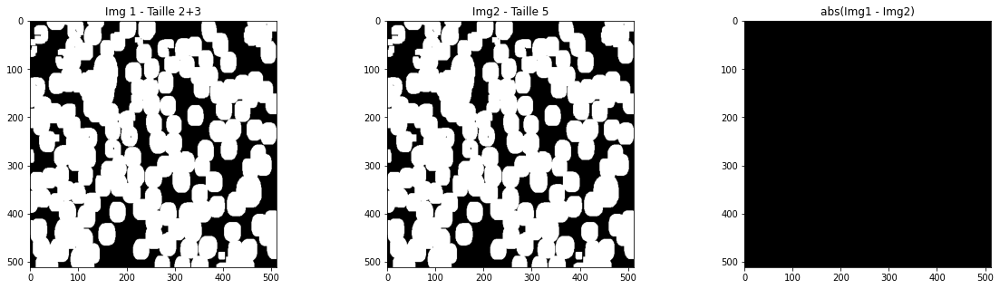

In [ ]:
strell = morpho.disk(2)
fig,ax = plt.subplots(2, 2, figsize=(10,10))

imgs = [
    morpho.binary_erosion(img, strell),
    morpho.binary_dilation(img, strell),
    morpho.binary_opening(img, strell),
    morpho.binary_closing(img, strell)
]# Add in this list the 4 images, obtained with the for operations
names = ["erosion","dilation","opening","closing"]
for i in range(4):
  ax[i//2,i%2].set_title(names[i])
  ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
plt.show()

# try your own structuring elements and make the size vary
if student :
  apply_dilation(img, morpho.disk)
  apply_dilation(img, line_strell)
  apply_dilation(img,morpho.square)

- **Q** : What is the influence of the shape of the structuring element ?
- **A** : It is possible to observe that the shape of the structuring element change the way objects appear in the image. For example, it is possible to see that using a structuring element with a disk shape, the cells in the dilated image "cell.tif" have a more rounded shape as result.
- **Q** : What is the influence of the size of the structuring element ?
- **A** : The structuring element's size change the size of the objects in the image, following the extensivity (or anti-extensivity) property to dilation (or erosion). In the images above, it is clear that the size of the cells in the image was changed according to the structuring element applied.

### Greyscale Morphology
In this section, we will use the bateau.tif image. Make sure to load it and visualize it in greyscale.


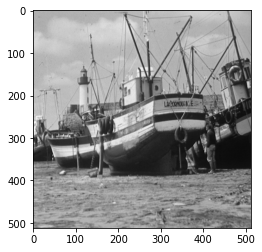

In [ ]:
#load the bateau image in grayscale and display it
if student:
  img = skio.imread("images/bateau.tif")
  plt.imshow(img, cmap = "gray")
  plt.show()

Apply the same 4 operations as before (dilation,erosion,opening,closing) and visualize the results. Try out different structuring elements and different sizes.

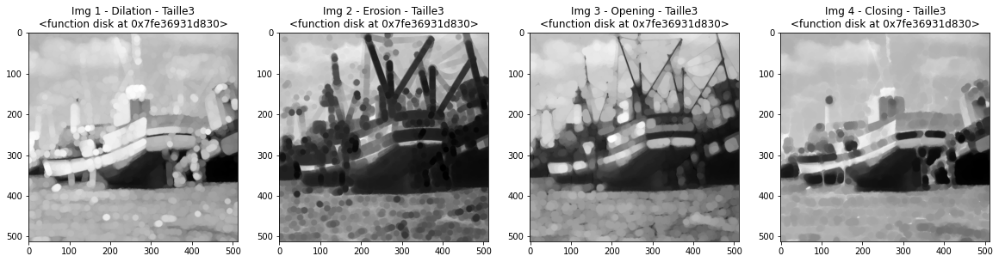

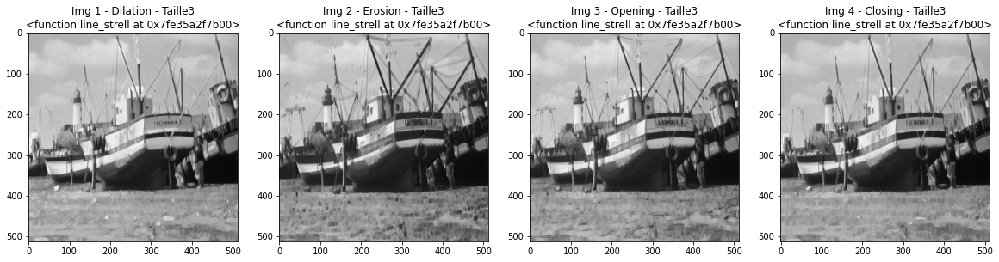

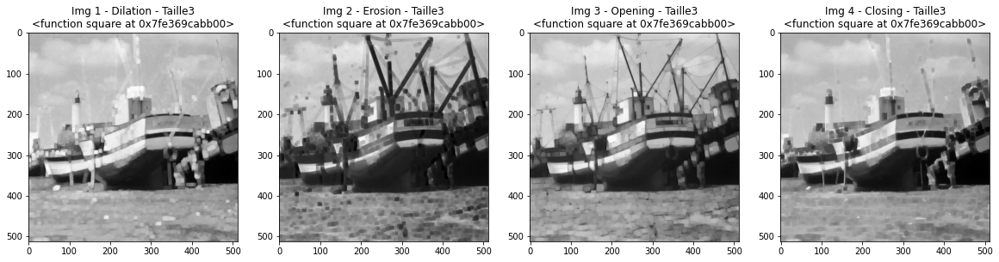

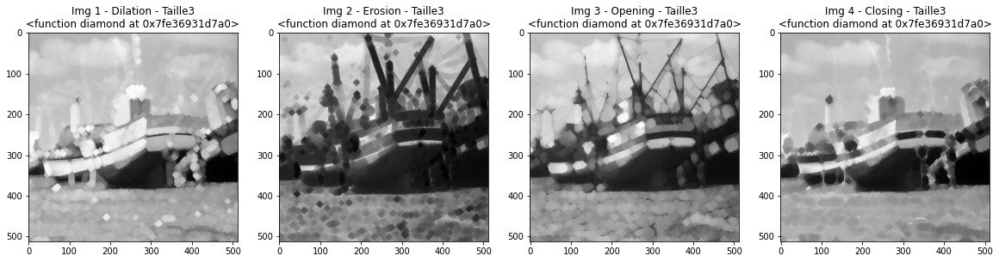

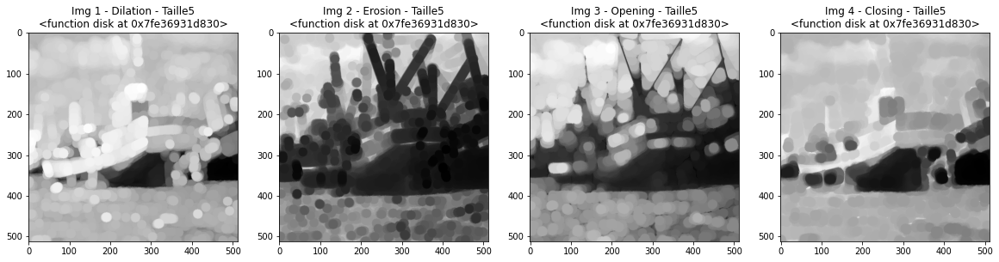

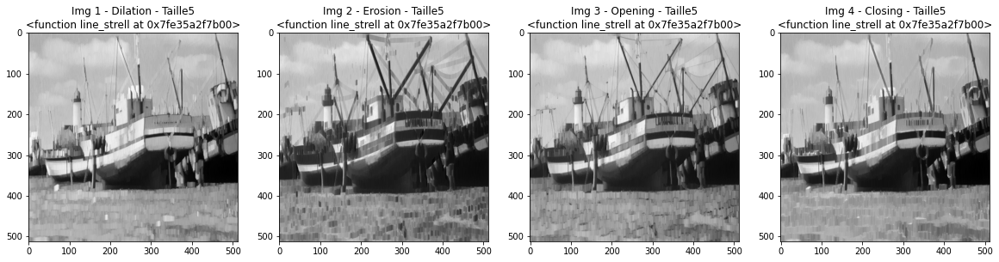

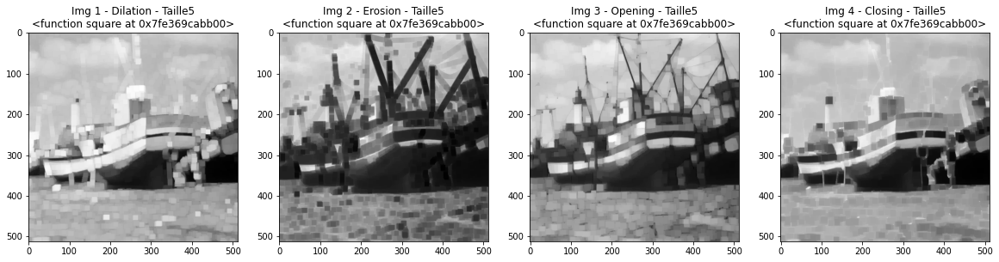

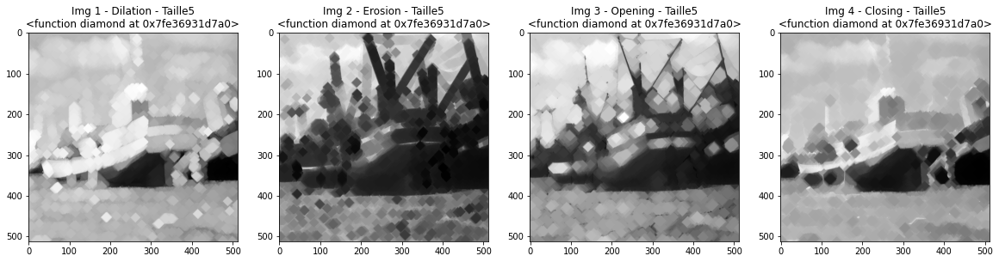

In [ ]:
if student:
  ### start code
  def apply_operations(img, strell, taille):
    strell_name = str(strell)
    strell = strell(2*taille+1)

    img1 = morpho.dilation(img, strell)
    img2 = morpho.erosion(img, strell)
    img3 = morpho.opening(img, strell)
    img4 = morpho.closing(img, strell)

    fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
    axs[0].imshow(img1, cmap="gray")
    axs[1].imshow(img2, cmap="gray")
    axs[2].imshow(img3, cmap="gray")
    axs[3].imshow(img4, cmap="gray")
    axs[0].set_title('Img 1 - Dilation - Taille'+str(taille)+'\n'+str(strell_name))
    axs[1].set_title('Img 2 - Erosion - Taille'+str(taille)+'\n'+str(strell_name))
    axs[2].set_title('Img 3 - Opening - Taille'+str(taille)+'\n'+str(strell_name))
    axs[3].set_title('Img 4 - Closing - Taille'+str(taille)+'\n'+str(strell_name))

  apply_operations(img, morpho.disk,3)
  apply_operations(img, line_strell,3)
  apply_operations(img, morpho.square,3)
  apply_operations(img, morpho.diamond,3)

  apply_operations(img, morpho.disk,5)
  apply_operations(img, line_strell,5)
  apply_operations(img, morpho.square,5)
  apply_operations(img, morpho.diamond,5)

  ### end code

- **Q** : What is the influence of the shape and size parameters of the structuring element ?
- **A** : As we could see in the previous question, the shape of the structuring element change the way that objects appear in the image. This effect is more visible when the erosion is applied (in this specific case). It is possible to notice that the cells assume a shape similar to the structuring element applied.

- For structuring elements with the same size but different shapes it is possible to observe that the disk and diamond shapes present more "agressive" results. It is noticeable that the dilation and the closing produces brighter images and the erosion and opening produces darker images.  

- When the size of SE are augmented, the objects in the erosion becomes darker and more fused. In the dilation the objets becomes brighter and also fused. This effects are more noticeable in the disk and diamond shapes.

- The objects becomes darker and brighter in the opening and closing, respectivelly, but in this case the global result is a blurred image.


- **Q** : How can you illustrate the iterativity property of the dilation ? What is the
result of a dilation by a structuring element of size 2 followed by a dilation by a
structuring element of size 3 (and same shape) ? Show your illustration in the next cell.
- **A** : The images below show the iterativity property of dilation. As it is possible to verify, the result of a dilation with a square structuring element of size 5 is the same that a dilation by a structuring element of size 2 followed by a dilation by a
structuring element of size 3.

True


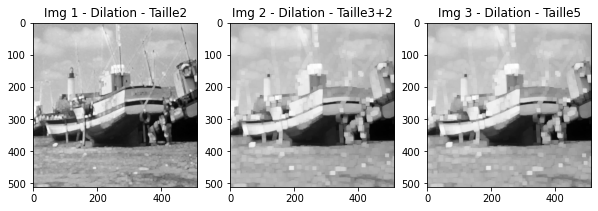

In [ ]:
if student:
  ### start code
  taille1=2

  img1 = morpho.dilation(img, morpho.square(2*taille1+1))
  taille2=3
  img2 = morpho.dilation(img1, morpho.square(2*taille2+1))

  taille3=5
  img3 = morpho.dilation(img, morpho.square(2*taille3+1))

  fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(10, 10))
  axs[0].imshow(img1, cmap="gray")
  axs[1].imshow(img2, cmap="gray")
  axs[2].imshow(img3, cmap="gray")
  axs[0].set_title('Img 1 - Dilation - Taille'+str(taille1))
  axs[1].set_title('Img 2 - Dilation - Taille'+str(taille2)+'+'+str(taille1))
  axs[2].set_title('Img 3 - Dilation - Taille'+str(taille3))

  print((img2==img3).all())
  ### end code

- **Q:** How can you illustrate the idempotence of closing ? Show your illustration in the following cell.


True True


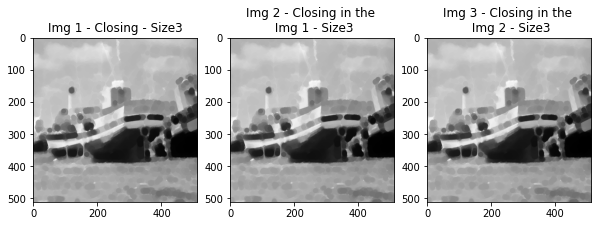

In [ ]:
if student :
  ### start code
  def closing(img, strell, taille):
    strell = strell(2*taille+1)
    img = morpho.erosion(morpho.dilation(img,strell),strell)
    return img

  taille=3
  img1 = closing(img, morpho.disk, taille)
  img2 = closing(img1, morpho.disk, taille)
  img3 = closing(img2, morpho.disk, taille)

  fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(10, 10))
  axs[0].imshow(img1, cmap="gray")
  axs[1].imshow(img2, cmap="gray")
  axs[2].imshow(img3, cmap="gray")
  axs[0].set_title('Img 1 - Closing - Size'+str(taille))
  axs[1].set_title('Img 2 - Closing in the \n Img 1 - Size'+str(taille))
  axs[2].set_title('Img 3 - Closing in the \n Img 2 - Size'+str(taille))

  print((img1==img2).all(),
        (img2==img3).all())
  ### end code

- **Q** : Perform a top-hat transform in the following cell (difference between the image and its opening).
Comment the result depending on the choice of the structuring element.
- **A** : It is possible to observe in the images below that the application of small structuring elements enables the observation of fine details of the image. If the structuring element are too small, the image becomes totally dark, but with a SE of size 6 it's possible to see some details.

- On the other hand, with elements too big the image becomes more similar to the original. With a SE of size 16 is possible to highlight the central region of the brain. Indeed, one of the main features of top hat transform it is to put in evidence white objets in a dark scene and vice-versa.

- About the shape, the line SE present a bad result compared to other shapes. Again, diamond and disk present similar results and a better performance with a small size compared to a square structuring element with the same size.

- It is important to emphasize that the top hat transform puts in evidence the elements of the image that are brighter than their surroundings.

In [ ]:
if student:
  ### start code
  def top_hat(img, strell, taille):
    strell = strell(2*taille+1)
    img_open = morpho.opening(img, strell)
    return img-img_open

  img = skio.imread("images/cerveau.tif")

  plt.imshow(img, cmap='gray')

  for i in range(1,50,10):
    strell = morpho.disk(2)
    taille=i
    top_hat1 = top_hat(img, morpho.disk, i)
    top_hat2 = top_hat(img, morpho.square, i)
    top_hat3 = top_hat(img, morpho.diamond, i)
    top_hat4 = top_hat(img, line_strell, i)

    fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(20, 20))
    axs[0].imshow(top_hat1, cmap="gray")
    axs[1].imshow(top_hat2, cmap="gray")
    axs[2].imshow(top_hat3, cmap="gray")
    axs[3].imshow(top_hat4, cmap="gray")
    axs[0].set_title('Img 1 - Top Hat - Disk - Taille'+str(taille))
    axs[1].set_title('Img 2 - Top Hat - Square - Taille'+str(taille))
    axs[2].set_title('Img 3 - Top Hat - Diamond - Taille'+str(taille))
    axs[3].set_title('Img 4 - Top Hat - Line - Taille'+str(taille))

  axs[3].imshow(img, cmap = "gray")



- **Q** : Perform a dual top-hat transform in the following cell (difference between the closing and the image).
Comment the result depending on the choice of the structuring element.
- **A** : The results obtained are very sumilar to the top-hat transform results. However, in this case the dark areas of the image are highlighted. More specifically, the dark regions inside the cells are highlighted by this transformation.

In [ ]:
if student:
  ### start code
  def dual_top_hat(img, strell, taille):
    strell = strell(2*taille+1)
    img_clos = morpho.closing(img, strell)
    return img_clos - img

  img = skio.imread("images/cerveau.tif")

  plt.imshow(img, cmap='gray')

  #strell = morpho.disk(2)
  for i in range(1, 50, 10):
    taille=i
    dual_top_hat1 = dual_top_hat(img, morpho.disk, i)
    dual_top_hat2 = dual_top_hat(img, morpho.square, i)
    dual_top_hat3 = dual_top_hat(img, morpho.diamond, i)
    dual_top_hat4 = dual_top_hat(img, line_strell, i)

    fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(20, 20))
    axs[0].imshow(dual_top_hat1, cmap="gray")
    axs[1].imshow(dual_top_hat2, cmap="gray")
    axs[2].imshow(dual_top_hat3, cmap="gray")
    axs[3].imshow(dual_top_hat4, cmap="gray")
    axs[0].set_title('Img 1 - Top Hat - Taille'+str(taille))
    axs[1].set_title('Img 2 - Top Hat - Taille'+str(taille))
    axs[2].set_title('Img 3 - Top Hat - Taille'+str(taille))
    axs[3].set_title('Img 4 - Top Hat - Taille'+str(taille))



### Alternating Filters
- **Q**: Perform alternate sequential filters, for instance by using the following code and trying out your own combinations. What kind of filtering can be expected from such
operations?
- **A**: It is possible to see that the application of alternated openings and closings functions, in that order, can works well as a low-pass filter. The application of closings and openings works very similar to the function above mentioned, as the images below allow to observe.

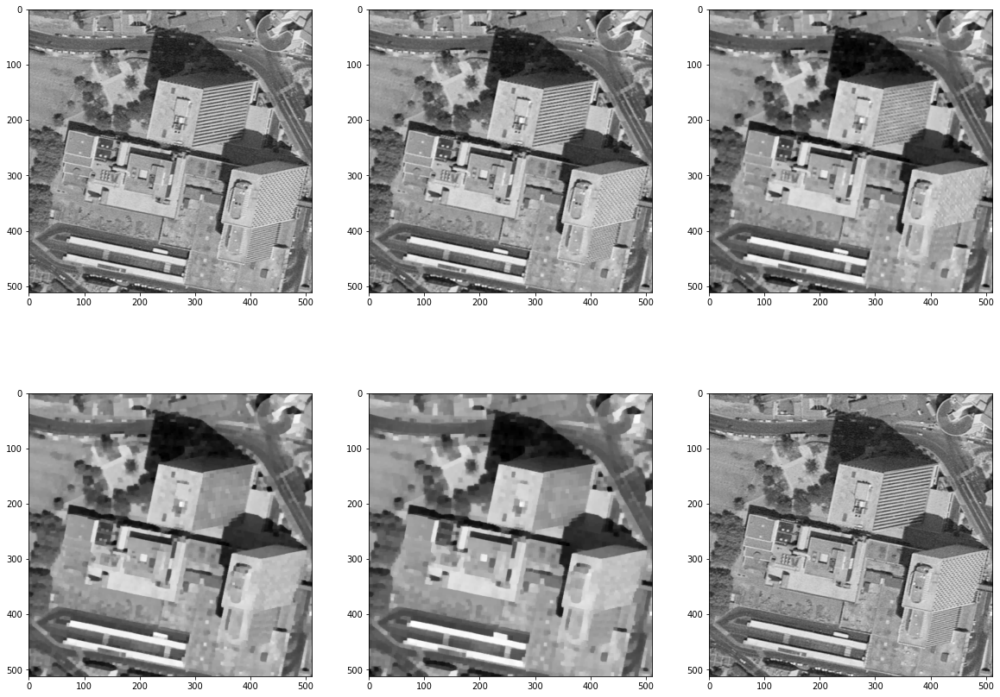

False


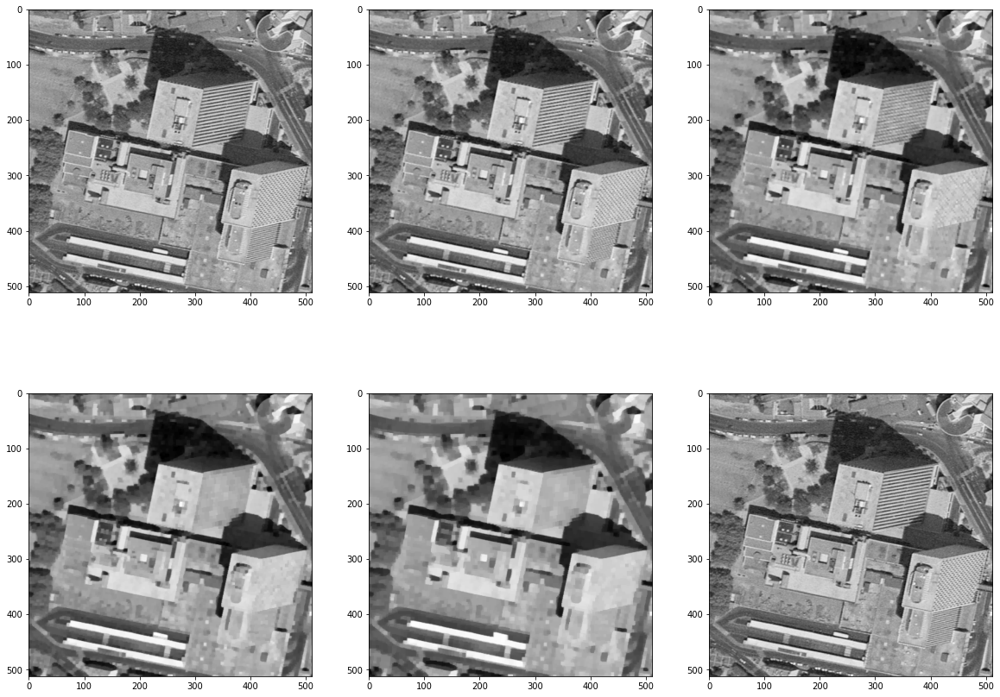

In [ ]:
# Example
img = skio.imread("images/montreuil.tif")
se1=morpho.square(1)
se2=morpho.square(2)
se3=morpho.square(3)
se4=morpho.square(4)
se5=morpho.square(5)
fas1=morpho.closing(morpho.opening(img,se1),se1)
fas2=morpho.closing(morpho.opening(fas1,se2),se2)
fas3=morpho.closing(morpho.opening(fas2,se3),se3)
fas4=morpho.closing(morpho.opening(fas3,se4),se4)
fas5=morpho.closing(morpho.opening(fas4,se5),se5)

fig,ax = plt.subplots(2,3,figsize = (20,15))
ax[0,0].imshow(fas1,cmap = "gray")
ax[0,1].imshow(fas2,cmap = "gray")
ax[0,2].imshow(fas3,cmap = "gray")
ax[1,0].imshow(fas4,cmap = "gray")
ax[1,1].imshow(fas5,cmap = "gray")
ax[1,2].imshow(img,cmap = "gray")
plt.show()

#Try you own
if student :
  img = skio.imread("images/montreuil.tif")
  se1=morpho.square(1)
  se2=morpho.square(2)
  se3=morpho.square(3)
  se4=morpho.square(4)
  se5=morpho.square(5)
  fas1=morpho.opening(morpho.closing(img,se1),se1)
  fas2=morpho.opening(morpho.closing(fas1,se2),se2)
  fas3=morpho.opening(morpho.closing(fas2,se3),se3)
  fas4=morpho.opening(morpho.closing(fas3,se4),se4)
  fas55=morpho.opening(morpho.closing(fas4,se5),se5)

  fig,ax = plt.subplots(2,3,figsize = (20,15))
  ax[0,0].imshow(fas1,cmap = "gray")
  ax[0,1].imshow(fas2,cmap = "gray")
  ax[0,2].imshow(fas3,cmap = "gray")
  ax[1,0].imshow(fas4,cmap = "gray")
  ax[1,1].imshow(fas55,cmap = "gray")
  ax[1,2].imshow(img,cmap = "gray")

  print((fas55==fas5).all())

### Segmentation
 - **Q** : Apply a morphological gradient to the image cell.tif (difference between
dilation and erosion with a structuring element of radius1). What do you observe ?

- **A**: It is possible to observe that the contours of the dark areas inside the cells are more prominent than the other contours in the image.

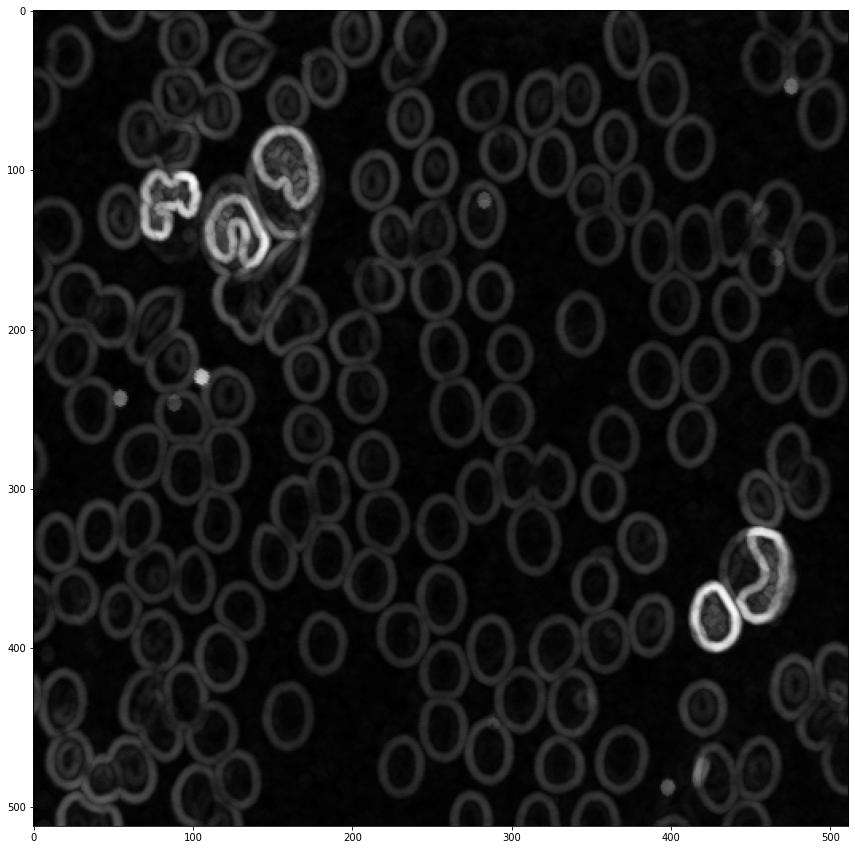

In [ ]:
if student :
  def morpho_gradient(img, strell, taille):
    strell = strell(2*taille+1)
    img_dil = morpho.dilation(img,strell)
    img_ero = morpho.erosion(img,strell)
    return abs(img_dil-img_ero)

  img = skio.imread("images/cell.tif")
  morpho_grad = morpho_gradient(img,morpho.disk,1)
plt.figure(figsize=(15,15))
plt.imshow(morpho_grad,cmap = "gray")
plt.show()


- **Q** : Try to threshold the gradient with a value of 25 for instance. Why is is difficult to find an appropriate threshold value ?
- **A** : The main difficult to find an appropriate threshold in this case is that the dark regions in the original image become the brightest regions of the morphological gradient. So, when we try to put a small threshold the contours of the small cells in the background become clear but that of the larger cells, with dark regions inside, is not so clear. When we put a bigger threshold the opposite happens. In short, it is very difficult to find a threshold that works well to all the objects in that image.

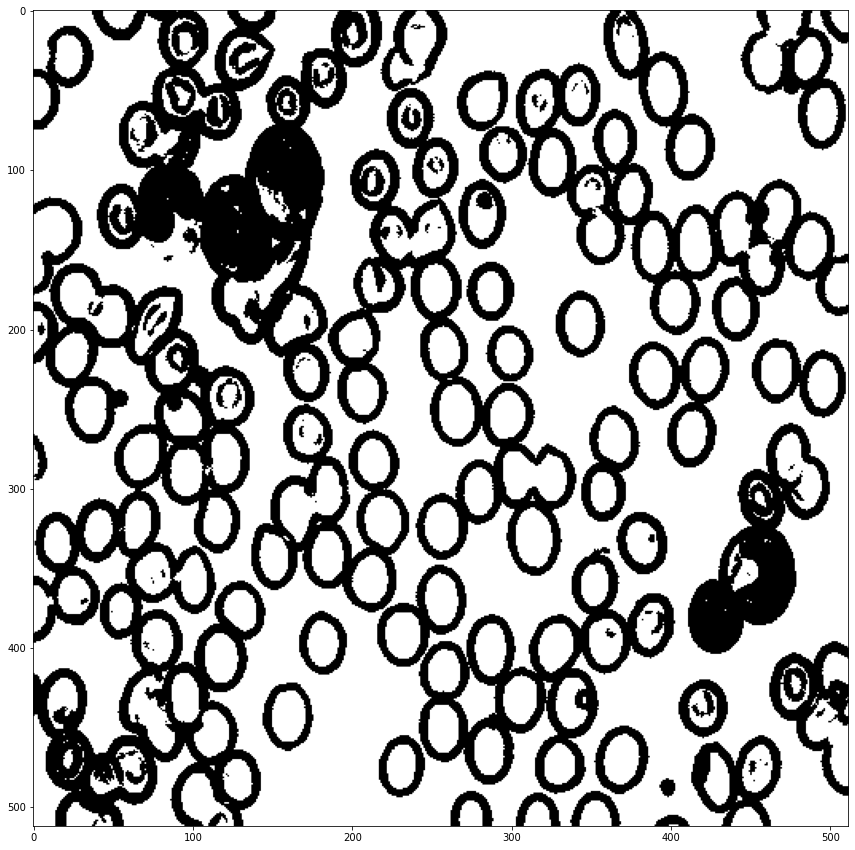

In [ ]:
if student :
  thresh_grad = (morpho_grad<15)
plt.figure(figsize=(15,15))
plt.imshow(thresh_grad,cmap  ="gray")
plt.show()


- **Q** Apply the watershed algorithm to the gradient image using morpho.watershed(morpho_grad,k) ;
What do you observe ?
- **A** : It is possible to observe different basins flooded and the watershed lines that split the basins.
- **Q** Try to change the parameter k ; what is the role of that parameter ?
- **A** : The parameter k defines the number of markers from wich each basin is flooded.

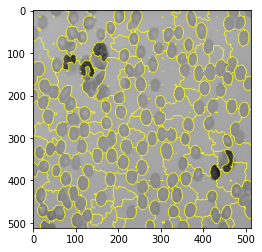

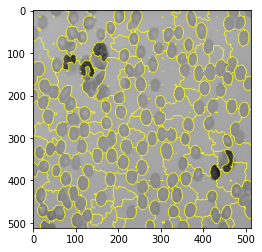

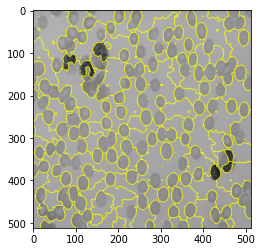

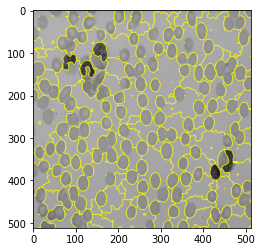

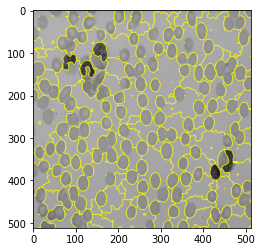

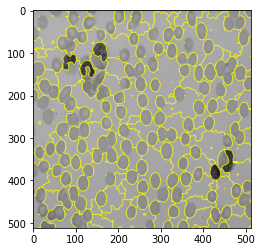

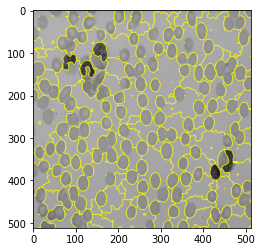

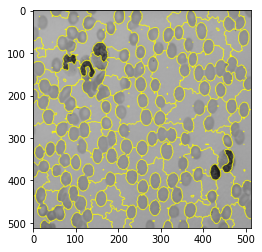

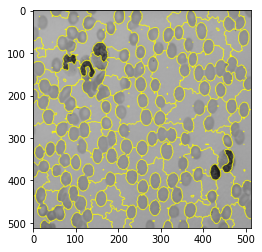

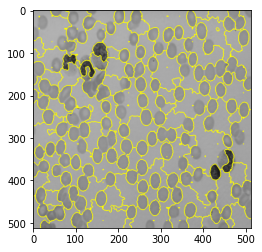

In [ ]:
import matplotlib
import skimage.segmentation as morpho1

cmaprand = matplotlib.colors.ListedColormap ( np.random.rand ( 256,3))
if student :
  aux=0
  wat = np.zeros((6,512,512))
  for i in range(250,300,5):
    wat = morpho1.watershed(morpho_grad, i);
    aux+=1

    plt.imshow(mark_boundaries(img, wat))
    plt.show()


- **Q** : Apply first a closing on the gradient image and then the watershed. Is the result better ? In which sense and why ?
- **A** : After a closing with a SE with a shape of disk and size 10, it is possible to observe that the basins in the watershed are badly divided. The result is globally worse.
- **Q** : Apply an opening with the same structuring element on the gradient image and then do a watershed. What is the difference between this operation and the previous?
- **A** : applying an opening instead of a closing results in an image with more closed basins, but the result is not satisfactory either.

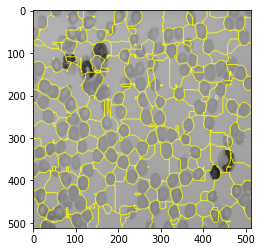

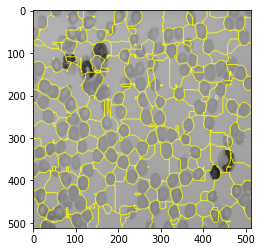

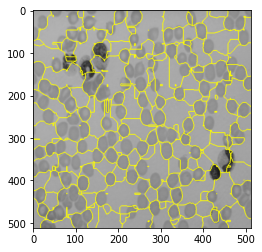

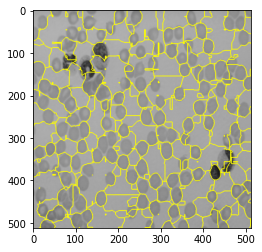

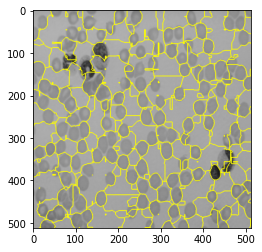

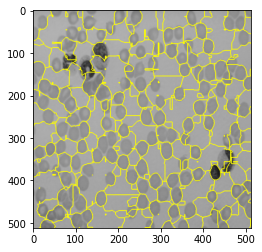

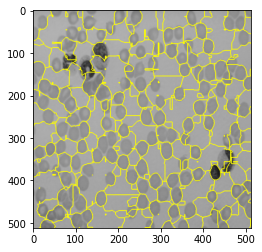

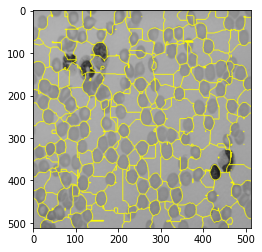

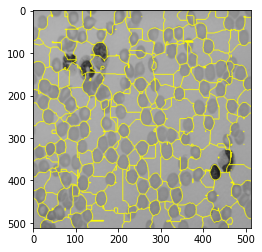

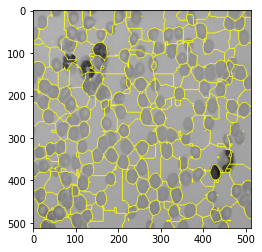

In [ ]:
from skimage.segmentation import watershed
from skimage.segmentation import mark_boundaries
from array import *


if student :
  aux = 0
  for i in range(250,300,5):
    wat_closing = watershed(morpho.closing(morpho_grad,morpho.disk(10)),i);
    aux+=1

    plt.imshow(mark_boundaries(img,wat_closing))
    plt.show()



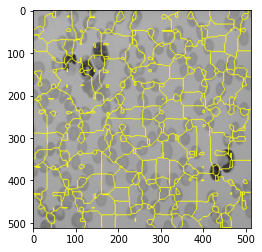

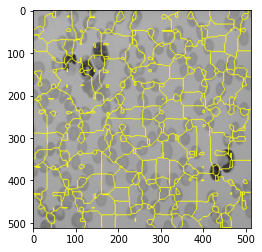

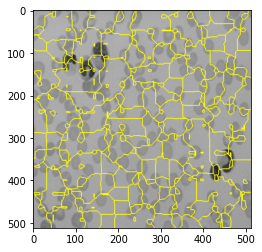

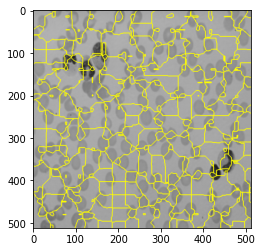

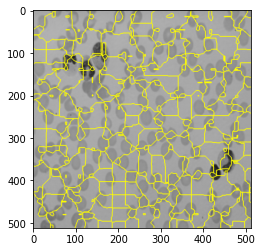

...

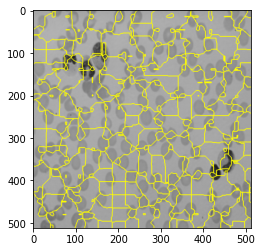

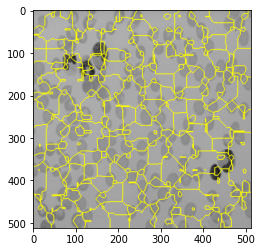

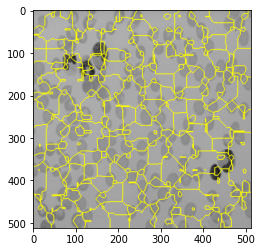

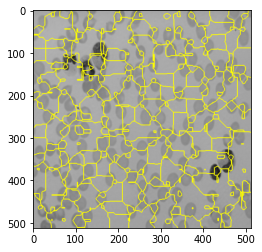

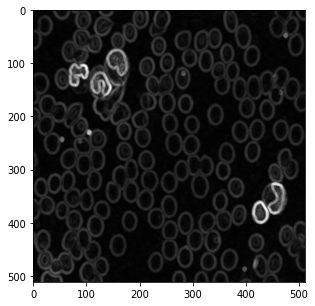

In [ ]:
if student :
  aux = 0
  for i in range(250,300,5):
    wat_opening = morpho1.watershed(morpho.opening(morpho_grad,morpho.disk(10)),i);
    plt.imshow(mark_boundaries(img,wat_opening))
    plt.show()

plt.figure(figsize =(5,5))
plt.imshow(morpho_grad,cmap ='gray')


We now propose to try to do better than what you did with the closure and opening by using specific markers for the watershed transform.

**Q** : In the next cell, compute the reconstruction from an opening of the gradient. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : It is possible to observe that the reconstruction from the opening of the gradient gives better results compared to the simple opening. However, we can verify some fails in the segmentation, for example: in the dark regions inside the cells.

When we use the sum of the markers obtained by the morphological gradient and the opening reconstruction the result is optimal. Observing the dark regions, in this case, it is possible to see that the regions are correct segmented.

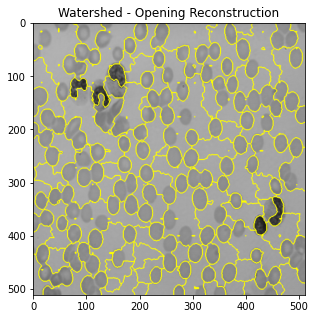

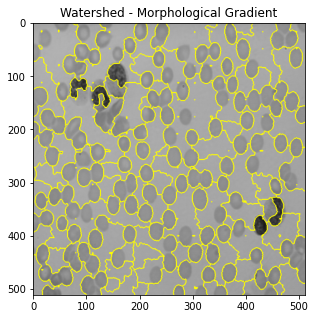

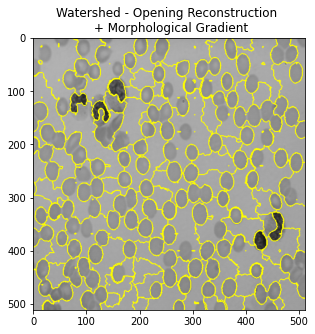

In [ ]:
imOpen =  morpho.opening(morpho_grad, morpho.disk(3))
recoOpen= morpho.reconstruction(imOpen, morpho_grad)

plt.figure(figsize =(5,5))
plt.imshow(mark_boundaries(img,morpho1.watershed(recoOpen,250)),cmap = "gray")
plt.title('Watershed - Opening Reconstruction')
plt.show()
plt.figure(figsize =(5,5))
plt.imshow(mark_boundaries(img,morpho1.watershed(morpho_grad,250)),cmap = "gray")
plt.title('Watershed - Morphological Gradient')
plt.show()
plt.figure(figsize =(5,5))
plt.imshow(mark_boundaries(img,morpho1.watershed(morpho_grad,250)+morpho1.watershed(recoOpen,250)),cmap = "gray")
plt.title('Watershed - Opening Reconstruction \n + Morphological Gradient')
plt.show()


**Q** : In the next cell, compute the reconstruction from an closing of the gradient. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : Analogously, the reconstruction from a closing provides better results than a simple closing. However, in this case is noticeable some regions badly segmented (dark regions, for example).

Also, the brighter areas look better segmented when comparing the result of the reconstruction from an opening with the result of this reconstruction with a closing.

It is remarkable that the reconstruction from the opening presents better results in the darkest areas of the image, while the reconstruction from the closing presents better results in the brighter areas. In that regard, we can conclude that the results are complementary.

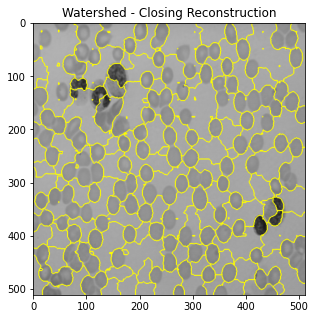

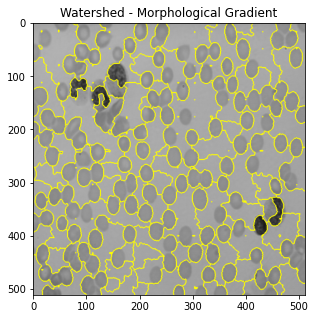

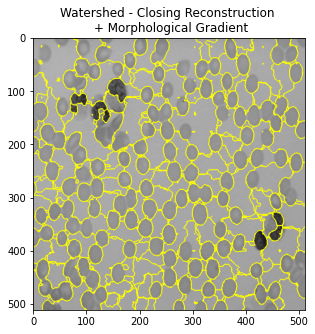

In [ ]:
imClos = morpho.closing(morpho_grad, morpho.disk(3))
recoClos = morpho.reconstruction( morpho_grad, imClos )

plt.figure(figsize =(5,5))
plt.imshow(mark_boundaries(img,morpho1.watershed(recoClos,250)),cmap = "gray")
plt.title('Watershed - Closing Reconstruction')
plt.show()
plt.figure(figsize =(5,5))
plt.imshow(mark_boundaries(img,morpho1.watershed(morpho_grad,250)),cmap = "gray")
plt.title('Watershed - Morphological Gradient')
plt.show()
plt.figure(figsize =(5,5))
plt.imshow(mark_boundaries(img,morpho1.watershed(morpho_grad,250)+morpho1.watershed(recoClos,250)),cmap = "gray")
plt.title('Watershed - Closing Reconstruction \n + Morphological Gradient')
plt.show()

**Q** : Use the reconstruction operation and the above questions to find good markers for the watershed algorithm. You could benefit from using the peak_local_max function of skimage.feature

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  


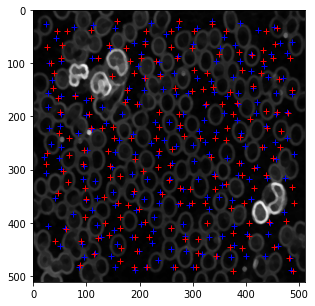

In [ ]:
from skimage.filters import rank,gaussian
from skimage.morphology import disk
from skimage.feature import peak_local_max

markers1 = peak_local_max(recoOpen.max()-recoOpen, min_distance=20,indices=True)
markers2 = peak_local_max(recoClos.max()-recoClos, min_distance=20,indices=True)

plt.figure(figsize=(5,5))
plt.imshow(recoClos, cmap=plt.cm.gray)
plt.plot(markers1[:,1],markers1[:,0],'b+')
plt.plot(markers2[:,1],markers2[:,0],'r+')
plt.show()

/usr/local/lib/python3.7/dist-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,
/usr/local/lib/python3.7/dist-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


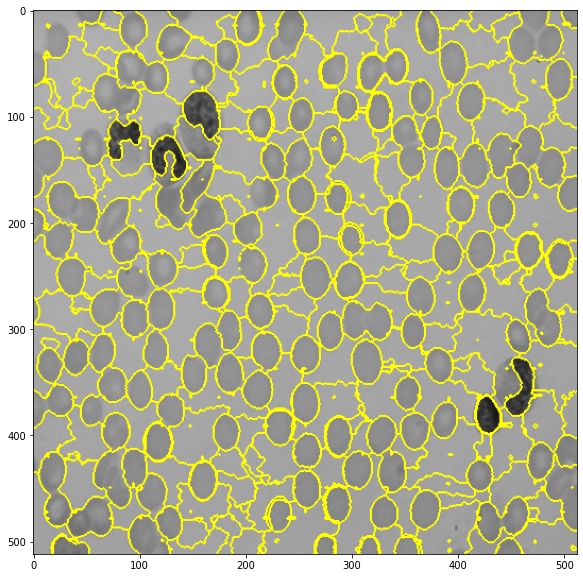

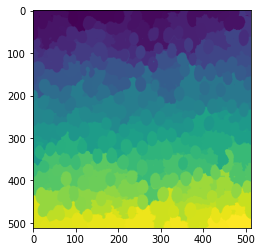

In [ ]:
from skimage.morphology import watershed
from skimage.segmentation import mark_boundaries
from skimage.measure import label

markers1 = label(markers1)
markers2 = label(markers2)
ws1 = watershed(recoOpen, markers1.max())
ws2 = watershed(recoOpen, markers2.max())

plt.figure(figsize=(10,10))
plt.imshow(mark_boundaries(img,ws1+ws2))
plt.figure()
plt.imshow(ws1+ws2)
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice.
  
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


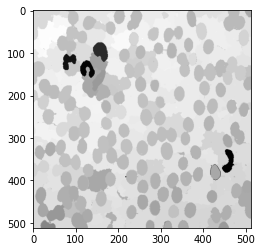

In [ ]:
def get_descr(region):
    return region.mean()

descriptors = np.zeros(((ws1+ws2).max()+1))
im_descriptors = np.zeros_like(img)

for i in range((ws1+ws2).min(),(ws1+ws2).max()+1):
    descriptors[i] = get_descr(img[(ws1+ws2)==i])
    im_descriptors[(ws1+ws2)==i] = descriptors[i]

plt.figure()
plt.imshow(im_descriptors, cmap='gray')
plt.show()

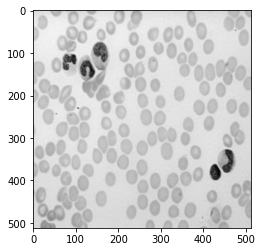

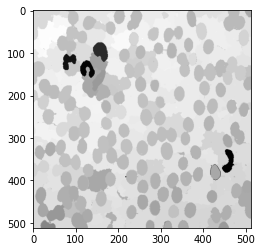

In [ ]:
mask = (im_descriptors<0.15)*(im_descriptors>0.3)

plt.figure()
plt.imshow(img, cmap='gray')
plt.show()
plt.imshow(im_descriptors, cmap='gray')
plt.show()